# clip-02-05.jl

Load Julia packages (libraries) needed  for the snippets in chapter 0

In [1]:
using StatisticalRethinking, Optim
gr(size=(600,300));

### snippet 3.2

Grid of 1001 steps

In [2]:
p_grid = range(0, step=0.001, stop=1);

all priors = 1.0

In [3]:
prior = ones(length(p_grid));

Binomial pdf

In [4]:
likelihood = [pdf(Binomial(9, p), 6) for p in p_grid];

As Uniform prior has been used, unstandardized posterior is equal to likelihood

In [5]:
posterior = likelihood .* prior;

Scale posterior such that they become probabilities

In [6]:
posterior = posterior / sum(posterior);

### snippet 3.3

Sample using the computed posterior values as weights

In [7]:
N = 10000
samples = sample(p_grid, Weights(posterior), N);

In StatisticalRethinkingJulia samples will always be stored
in an MCMCChains.Chains object.

In [8]:
chn = MCMCChains.Chains(reshape(samples, N, 1, 1), [:toss]);

Describe the chain

In [9]:
describe(chn)

Log evidence      = 0.0
Iterations        = 1:10000
Thinning interval = 1
Chains            = Chain1
Samples per chain = 10000
parameters        = toss

Empirical Posterior Estimates:
parameters
      Mean    SD   Naive SE  MCSE     ESS  
toss 0.6368 0.1386   0.0014 0.0015 8801.204

Quantiles:
parameters
      2.5% 25.0% 50.0% 75.0% 97.5%
toss 0.165 0.543 0.646  0.74 0.976



Plot the chain

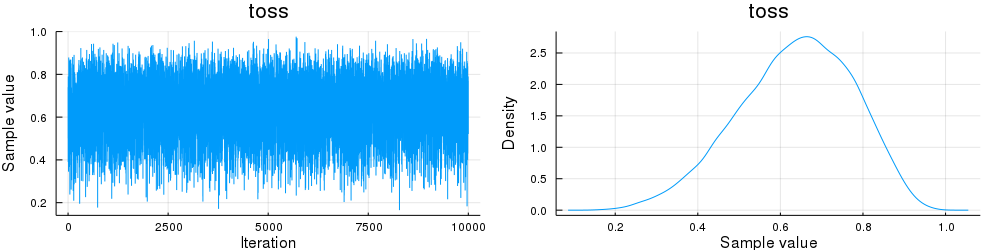

In [10]:
plot(chn)

Compute the MAP (maximum_a_posteriori) estimate

In [11]:
x0 = [0.5]
lower = [0.0]
upper = [1.0]

function loglik(x)
  ll = 0.0
  ll += log.(pdf.(Beta(1, 1), x[1]))
  ll += sum(log.(pdf.(Binomial(9, x[1]), repeat([6], N))))
  -ll
end

(qmap, opt) = quap(samples, loglik, lower, upper, x0)

([0.6666666666544907], Results of Optimization Algorithm
 * Algorithm: Fminbox with Gradient Descent
 * Starting Point: [0.5]
 * Minimizer: [0.6666666666544907]
 * Minimum: 1.297811e+04
 * Iterations: 4
 * Convergence: true
   * |x - x'| ≤ 0.0e+00: false 
     |x - x'| = 5.74e-11 
   * |f(x) - f(x')| ≤ 0.0e+00 |f(x)|: true
     |f(x) - f(x')| = 0.00e+00 |f(x)|
   * |g(x)| ≤ 1.0e-08: false 
     |g(x)| = 1.80e-06 
   * Stopped by an increasing objective: false
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 108
 * Gradient Calls: 108)

Show optimization results

In [12]:
opt

Results of Optimization Algorithm
 * Algorithm: Fminbox with Gradient Descent
 * Starting Point: [0.5]
 * Minimizer: [0.6666666666544907]
 * Minimum: 1.297811e+04
 * Iterations: 4
 * Convergence: true
   * |x - x'| ≤ 0.0e+00: false 
     |x - x'| = 5.74e-11 
   * |f(x) - f(x')| ≤ 0.0e+00 |f(x)|: true
     |f(x) - f(x')| = 0.00e+00 |f(x)|
   * |g(x)| ≤ 1.0e-08: false 
     |g(x)| = 1.80e-06 
   * Stopped by an increasing objective: false
   * Reached Maximum Number of Iterations: false
 * Objective Calls: 108
 * Gradient Calls: 108

Fit quadratic approcimation

In [13]:
quapfit = [qmap[1], std(samples, mean=qmap[1])]

2-element Array{Float64,1}:
 0.6666666666544907
 0.1418003178536608

### snippet 3.4

Create a vector to hold the plots so we can later combine them

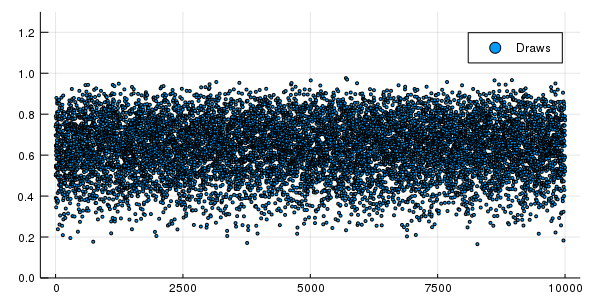

In [14]:
p = Vector{Plots.Plot{Plots.GRBackend}}(undef, 2)
p[1] = scatter(1:N, samples, markersize = 2, ylim=(0.0, 1.3), lab="Draws")

### snippet 3.5

Analytical calculation

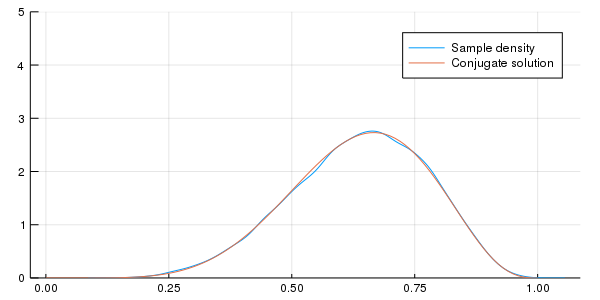

In [15]:
w = 6
n = 9
x = 0:0.01:1
p[2] = density(samples, ylim=(0.0, 5.0), lab="Sample density")
p[2] = plot!( x, pdf.(Beta( w+1 , n-w+1 ) , x ), lab="Conjugate solution")

Add quadratic approximation

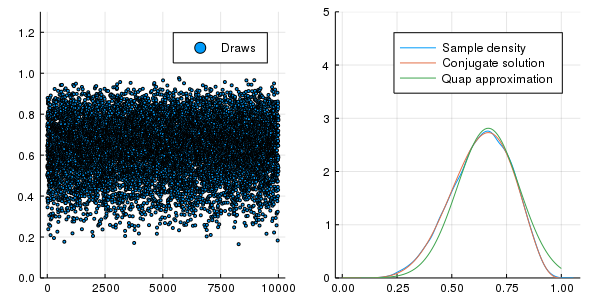

In [16]:
plot!( p[2], x, pdf.(Normal( quapfit[1], quapfit[2] ) , x ), lab="Quap approximation")
plot(p..., layout=(1, 2))

End of `clip_02_05.jl`

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*